In [ ]:
出现新目标的图片
89
364
937
1231
1275
1596
1666
1792
1909
1926
2222
2523
2529
2567
2837
2936
2995
2996

In [3]:
#前4000出现新目标的图片
list=[89,364,937,1231,1275,1596,1666,1792,1909,1926,2222,2523,2529,2567,2837,2936,2995,2996]
len(list)

18

In [1]:
list=[1,2,3]
list.remove(2)
list

[1, 3]

In [7]:
import torch
frame_dete_4000=torch.load("/home/zhiqiang/project/frame_box_subway_dete_ten_minute_4000.pkl")
frame_dete_4000[88]


[[346, 1624, 453, 1699]]

In [17]:
import torch
frame_dete_4000=torch.load("/home/zhiqiang/project/new_obj_area_subway_4000.pkl")
frame_dete_4000[]

[[206, 125, 259, 180],
 [318, 1530, 392, 1570],
 [319, 1540, 396, 1570],
 [82, 104, 117, 136],
 [81, 82, 154, 126],
 [289, 1542, 360, 1570],
 [314, 1541, 377, 1567],
 [219, 168, 256, 208],
 [85, 132, 149, 175],
 [346, 1659, 391, 1691],
 [256, 336, 293, 371],
 [290, 1569, 333, 1601],
 [213, 152, 257, 192],
 [300, 1640, 335, 1675],
 [317, 1542, 375, 1568],
 [315, 1543, 376, 1568],
 [85, 134, 146, 173],
 [346, 1629, 420, 1668]]

206 259 125 180
318 392 1530 1570
319 396 1540 1570
82 117 104 136
81 154 82 126
289 360 1542 1570
314 377 1541 1567
219 256 168 208
85 149 132 175
346 391 1659 1691
256 293 336 371
290 333 1569 1601
213 257 152 192
300 335 1640 1675
317 375 1542 1568
315 376 1543 1568
85 146 134 173
346 420 1629 1668


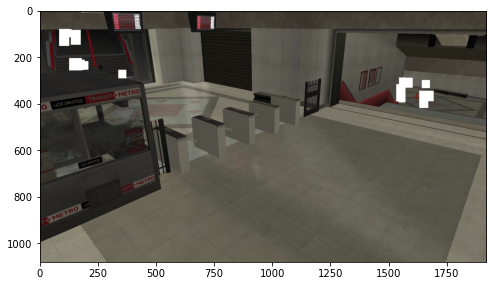

In [1]:
import torch
import cv2
import matplotlib.pyplot as plt
box_new_obj=torch.load("/home/zhiqiang/project/new_obj_area_subway_4000.pkl")
img = cv2.imread('/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/1.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
for i in box_new_obj:
    print(i[0],i[2],i[1],i[3])
    img_rgb[i[0]:i[2],i[1]:i[3]]=255
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)


In [4]:
import cv2
aa = [[1050, 0, 1260, 144], [1085, 0, 1295, 144], [1015, 23, 1225, 168], [1050, 23, 1260, 168], [280, 782, 490, 960]]
rec,weight=cv2.groupRectangles(aa, 2, 0.2)
print(rec)
print(weight)

[[1050   12 1260  156]]
[4]


[[ 213  148  257  193]
 [ 315 1574  376 1605]
 [  85  133  148  174]]
[ 3 10  2]


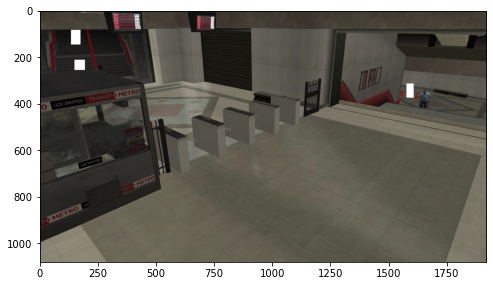

In [10]:
import torch
import cv2
import matplotlib.pyplot as plt
box_new_obj=torch.load("/home/zhiqiang/project/new_obj_area_subway_4000.pkl")
img = cv2.imread('/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/1.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rect,weights=cv2.groupRectangles(box_new_obj, 1, 0.3)
print(rect)
print(weights)
for i in rect:
    #print(i[0],i[2],i[1],i[3])
    img_rgb[i[0]:i[2],i[1]:i[3]]=255
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)

41
[[206, 125, 53, 55], [206, 125, 53, 83], [206, 125, 53, 67], [318, 1530, 78, 40], [318, 1530, 74, 40], [289, 1530, 103, 40], [314, 1530, 78, 40], [290, 1530, 102, 71], [317, 1530, 75, 40], [315, 1530, 77, 40], [319, 1540, 77, 30], [289, 1540, 107, 30], [314, 1540, 82, 30], [290, 1540, 106, 61], [317, 1540, 79, 30], [315, 1540, 81, 30], [81, 82, 73, 54], [82, 104, 35, 32], [82, 104, 67, 71], [82, 104, 64, 69], [81, 82, 73, 44], [289, 1541, 88, 29], [289, 1542, 71, 28], [289, 1542, 71, 59], [289, 1542, 86, 28], [289, 1542, 87, 28], [314, 1541, 63, 26], [314, 1541, 63, 27], [219, 168, 37, 40], [213, 152, 44, 56], [85, 132, 64, 43], [346, 1659, 45, 32], [346, 1629, 74, 62], [256, 336, 37, 35], [290, 1569, 43, 32], [213, 152, 44, 40], [300, 1640, 35, 35], [315, 1542, 61, 26], [317, 1542, 58, 26], [315, 1543, 61, 25], [85, 134, 61, 39]]


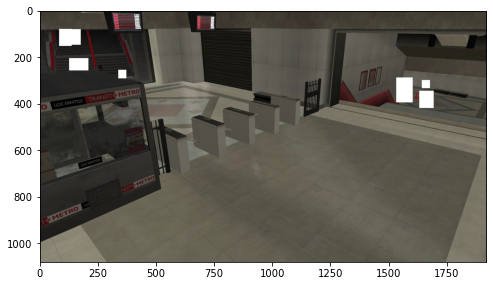

In [82]:
import itertools
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

def remove_duplicated(boxes_list):
        res = []
        for i in boxes_list:
            if i not in res:
                res.append(i)
        return res

def intersection(a,b):
  x = max(a[0], b[0])
  y = max(a[1], b[1])
  w = min(a[0]+a[2], b[0]+b[2]) - x
  h = min(a[1]+a[3], b[1]+b[3]) - y
  if w<0 or h<0: return () # or (0,0,0,0) ?
  return [x, y, w, h]

def union(a,b):
  x = min(a[0], b[0])
  y = min(a[1], b[1])
  w = max(a[0]+a[2], b[0]+b[2]) - x
  h = max(a[1]+a[3], b[1]+b[3]) - y
  return [x, y, w, h]

def combine_boxes(boxes):
    new_array = []
    for boxa, boxb in itertools.combinations(boxes, 2):
        if intersection(boxa, boxb):
            new_array.append(union(boxa, boxb))
        else:
            new_array.append(boxa)
    return new_array


boxes=torch.load("/home/zhiqiang/project/new_obj_area_subway_4000.pkl")
new_list_boxes=[]
for j in boxes:
    new_list_boxes.append([j[0],j[1],j[2]-j[0],j[3]-j[1]])
#print(new_list_boxes)
img = cv2.imread('/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/1.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
new_boxes = combine_boxes(new_list_boxes)
new_boxes = remove_duplicated(new_boxes)
print(len(new_boxes))
print(new_boxes)

for i in new_boxes:
    #print(i[0],i[1],i[0]+i[2],i[1]+i[3])
    img_rgb[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)

41
[[206, 125, 53, 55], [206, 125, 53, 83], [206, 125, 53, 67], [318, 1530, 78, 40], [318, 1530, 74, 40], [289, 1530, 103, 40], [314, 1530, 78, 40], [290, 1530, 102, 71], [317, 1530, 75, 40], [315, 1530, 77, 40], [319, 1540, 77, 30], [289, 1540, 107, 30], [314, 1540, 82, 30], [290, 1540, 106, 61], [317, 1540, 79, 30], [315, 1540, 81, 30], [81, 82, 73, 54], [82, 104, 35, 32], [82, 104, 67, 71], [82, 104, 64, 69], [81, 82, 73, 44], [289, 1541, 88, 29], [289, 1542, 71, 28], [289, 1542, 71, 59], [289, 1542, 86, 28], [289, 1542, 87, 28], [314, 1541, 63, 26], [314, 1541, 63, 27], [219, 168, 37, 40], [213, 152, 44, 56], [85, 132, 64, 43], [346, 1659, 45, 32], [346, 1629, 74, 62], [256, 336, 37, 35], [290, 1569, 43, 32], [213, 152, 44, 40], [300, 1640, 35, 35], [315, 1542, 61, 26], [317, 1542, 58, 26], [315, 1543, 61, 25], [85, 134, 61, 39]]
53
[[206, 125, 53, 83], [206, 125, 53, 67], [206, 125, 53, 55], [318, 1530, 78, 40], [289, 1530, 107, 40], [314, 1530, 82, 40], [290, 1530, 106, 71], [317

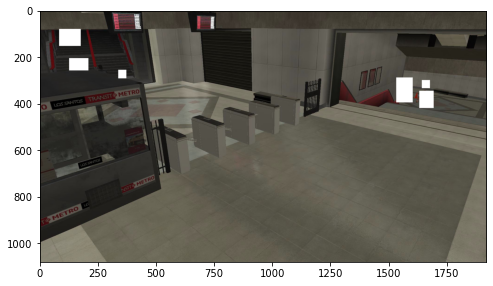

In [83]:
import itertools
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

def remove_duplicated(boxes_list):
        res = []
        for i in boxes_list:
            if i not in res:
                res.append(i)
        return res

def intersection(a,b):
  x = max(a[0], b[0])
  y = max(a[1], b[1])
  w = min(a[0]+a[2], b[0]+b[2]) - x
  h = min(a[1]+a[3], b[1]+b[3]) - y
  if w<0 or h<0: return () # or (0,0,0,0) ?
  return [x, y, w, h]

def union(a,b):
  x = min(a[0], b[0])
  y = min(a[1], b[1])
  w = max(a[0]+a[2], b[0]+b[2]) - x
  h = max(a[1]+a[3], b[1]+b[3]) - y
  return [x, y, w, h]

def combine_boxes(boxes):
    new_array = []
    for boxa, boxb in itertools.combinations(boxes, 2):
        if intersection(boxa, boxb):
            new_array.append(union(boxa, boxb))
        else:
            new_array.append(boxa)
    return new_array


boxes=torch.load("/home/zhiqiang/project/new_obj_area_subway_4000.pkl")
new_list_boxes=[]
for j in boxes:
    new_list_boxes.append([j[0],j[1],j[2]-j[0],j[3]-j[1]])
#print(new_list_boxes)
img = cv2.imread('/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/1.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
new_boxes = combine_boxes(new_list_boxes)
new_boxes = remove_duplicated(new_boxes)
print(len(new_boxes))
print(new_boxes)

new_boxes = combine_boxes(new_boxes)
new_boxes = remove_duplicated(new_boxes)
print(len(new_boxes))
print(new_boxes)

for i in new_boxes:
    #print(i[0],i[1],i[0]+i[2],i[1]+i[3])
    img_rgb[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)

18
17
16
15
14
13
12
12
10
9
9
7
6
5
5
4
2
2
new_result 6
[[256, 336, 37, 35], [300, 1640, 35, 35], [346, 1629, 74, 62], [206, 125, 53, 83], [81, 82, 73, 93], [289, 1530, 107, 71]]
[256, 336, 293, 371]
[300, 1640, 335, 1675]
[346, 1629, 420, 1691]
[206, 125, 259, 208]
[81, 82, 154, 175]
[289, 1530, 396, 1601]


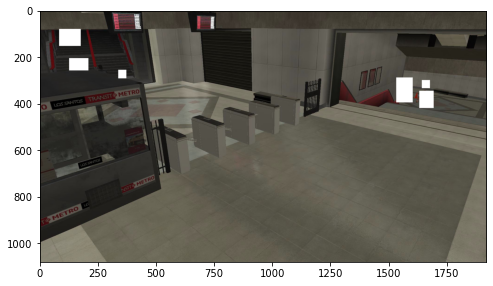

In [1]:
import itertools
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt


def remove_duplicated(boxes_list):
    res = []
    for i in boxes_list:
        if i not in res:
            res.append(i)
    return res


def intersection(a, b):
    x = max(a[0], b[0])
    y = max(a[1], b[1])
    w = min(a[0] + a[2], b[0] + b[2]) - x
    h = min(a[1] + a[3], b[1] + b[3]) - y
    if w < 0 or h < 0: return ()  # or (0,0,0,0) ?
    return [x, y, w, h]


def union(a, b):
    x = min(a[0], b[0])
    y = min(a[1], b[1])
    w = max(a[0] + a[2], b[0] + b[2]) - x
    h = max(a[1] + a[3], b[1] + b[3]) - y
    return [x, y, w, h]


boxes = torch.load("/home/zhiqiang/project/new_obj_area_subway_4000.pkl")
new_list_boxes = []
for j in boxes:
    new_list_boxes.append([j[0], j[1], j[2] - j[0], j[3] - j[1]])

print(len(new_list_boxes))
new_result = []

def combine_boxes(boxes):
    num=0
    num_=len(boxes)-1
    for i in range(1, len(boxes)):

        if intersection(boxes[0], boxes[i]):
            tmp_0=boxes[0]
            tmp_i=boxes[i]
            box_tmp = union(boxes[0], boxes[i])
            boxes.remove(tmp_0)
            boxes.remove(tmp_i)
            boxes.append(box_tmp)
            break
        else:
            num=num+1
    if num==num_:
        return 0



while True:
    tmp = combine_boxes(new_list_boxes)
    print(len(new_list_boxes))
    if tmp==0:
        new_result.append(new_list_boxes[0])
        tmp=new_list_boxes[0]
        new_list_boxes.remove(tmp)
    if len(new_list_boxes) == 1:
        new_result.append(new_list_boxes[0])
        break

print("new_result",len(new_result))
print(new_result)

img = cv2.imread('/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/1.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

for i in new_result:
    #print(i[0],i[1],i[0]+i[2],i[1]+i[3])
    img_rgb[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
    print([i[0],i[1],i[0]+i[2],i[1]+i[3]])
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)

In [ ]:
# 4000帧统计出来的可能出现新目标的区域
[256, 336, 293, 371]
[300, 1640, 335, 1675]
[346, 1629, 420, 1691]
[206, 125, 259, 208]
[81, 82, 154, 175]
[289, 1530, 396, 1601]

[256, 336, 293, 371]


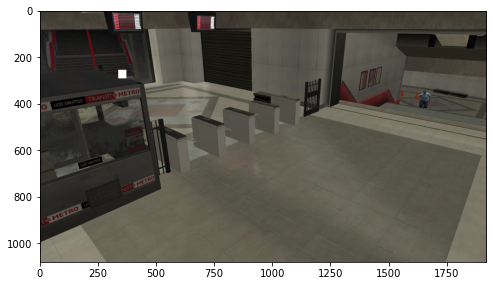

In [4]:
img = cv2.imread('/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/1.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
i=[256, 336, 37, 35]
img_rgb[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
print([i[0],i[1],i[0]+i[2],i[1]+i[3]])

plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)

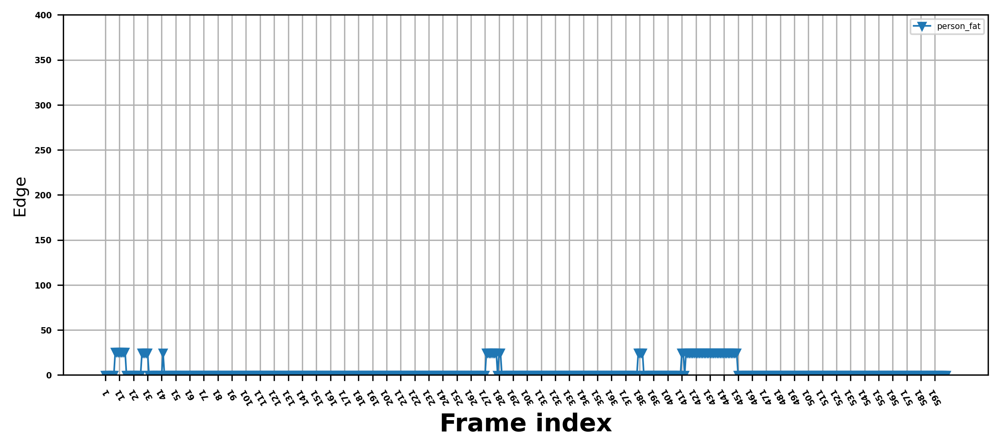

In [82]:
import torch as t
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(10, 4),dpi=300)
a=1
b=600
#x_=np.arange(2,252,1)
x_=np.arange(a,b,1)
y_accuracy=[]
err_list_subway=t.load("/home/zhiqiang/project/frame_edge_dict_subway0.pkl")
for i in range(a,b):
    y_accuracy.append(err_list_subway[i])

x = list(np.arange(a,b,10))
#plt.grid(linestyle="-",color="r")
#plt.grid(True)
lw=1.0
plt.plot(x_, y_accuracy,label="person_fat",linestyle='-',linewidth=lw,marker='v',markersize='3',markeredgewidth=2)
plt.grid(True)
plt.xticks(x, x)
plt.ylim((0, 400))
plt.xticks(fontsize=5,weight="bold",rotation=120)
plt.yticks(fontsize=5,weight="bold")
plt.ylabel("Edge",fontsize=10)  #X轴标签
plt.xlabel("Frame index",fontsize=15,weight="bold") #Y轴标签
#plt.xlabel('Minimun-object-area-ratio*1000',fontsize=20)
#plt.ylabel('Y')#通过 xlim 和 ylim 来设限定轴的范围，通过 xlabel 和 ylabel 来设置轴的名称
plt.legend(loc='best',fontsize=5)

/home/zhiqiang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


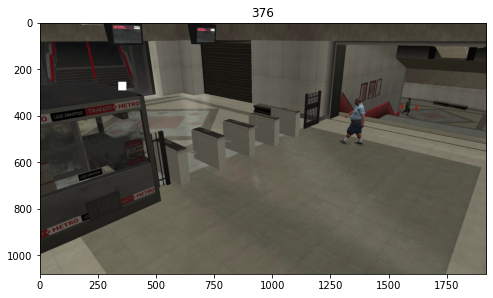

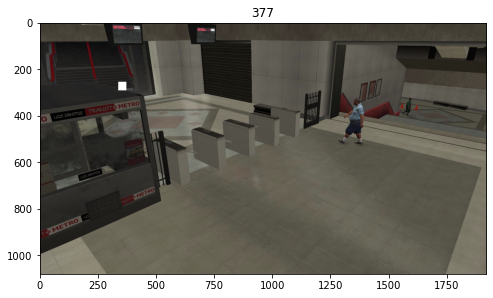

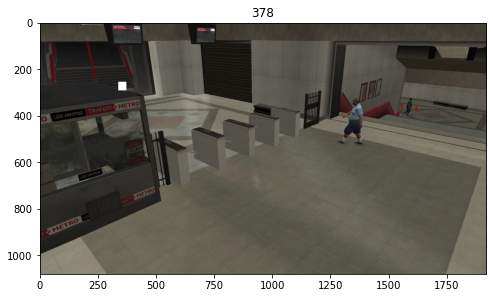

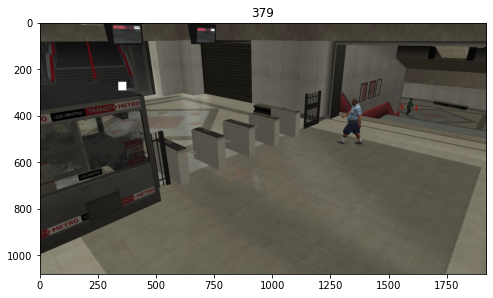

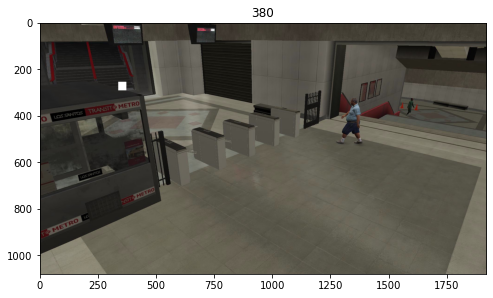

...

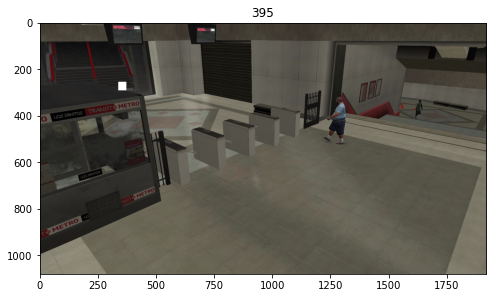

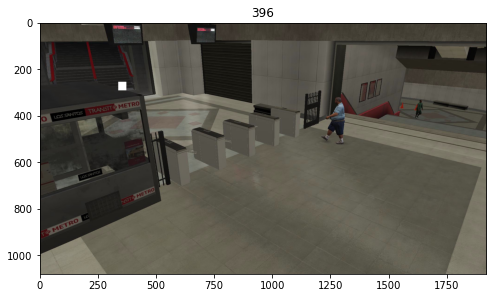

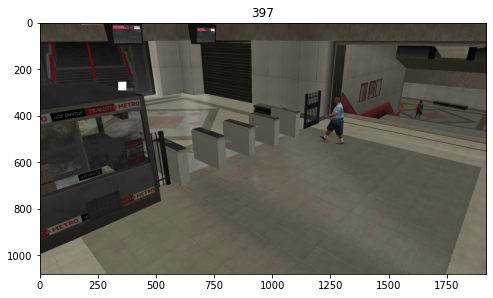

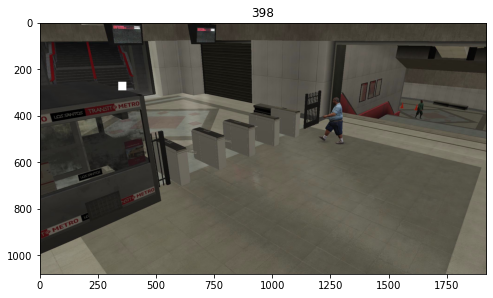

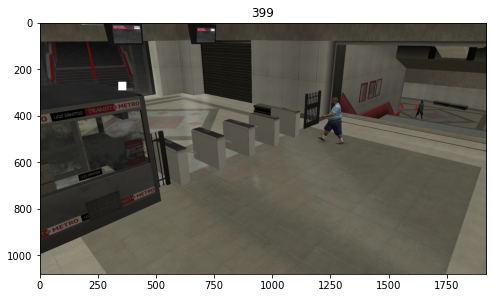

In [25]:
i=[256, 336, 37, 35]
for index in range(376, 400):
    frame = str(index)
    img = cv2.imread(r"/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/" + frame + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
    index=str(index)
    plt.figure(figsize=(8, 6),)
    plt.title(index)
    plt.imshow(img)

[300, 1640, 335, 1675]


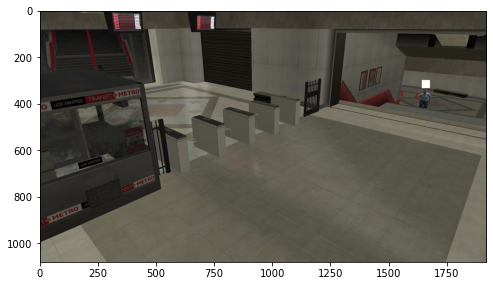

In [11]:
img = cv2.imread('/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/1.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
i=[300, 1640, 35, 35]
img_rgb[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
print([i[0],i[1],i[0]+i[2],i[1]+i[3]])

plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)

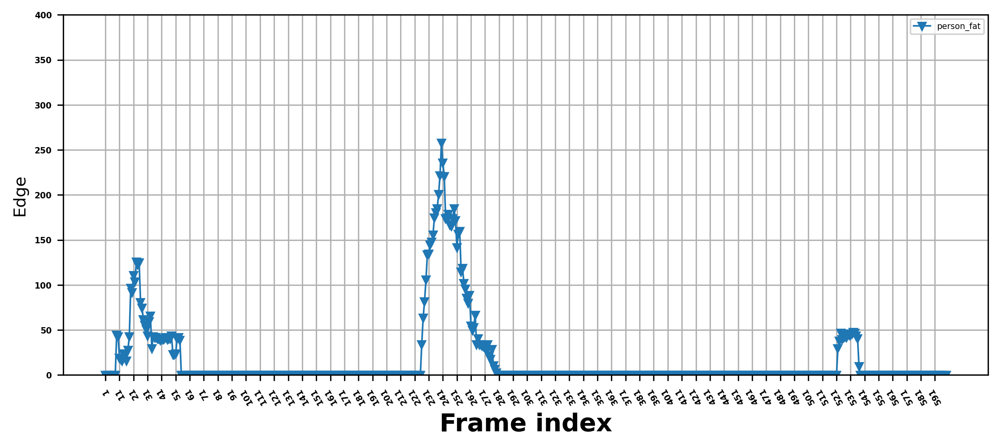

In [81]:
import torch as t
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(10, 4),dpi=300)
a=1
b=600
x_=np.arange(a,b,1)
y_accuracy=[]
err_list_subway=t.load("/home/zhiqiang/project/frame_edge_dict_subway1.pkl")
for i in range(a,b):
    y_accuracy.append(err_list_subway[i])

x = list(np.arange(a,b,10))
#plt.grid(linestyle="-",color="r")
#plt.grid(True)
lw=1.0
plt.plot(x_, y_accuracy,label="person_fat",linestyle='-',linewidth=lw,marker='v',markersize='3',markeredgewidth=2)
plt.grid(True)
plt.xticks(x, x)
plt.ylim((0, 400))
plt.xticks(fontsize=5,weight="bold",rotation=120)
plt.yticks(fontsize=5,weight="bold")
plt.ylabel("Edge",fontsize=10)  #X轴标签
plt.xlabel("Frame index",fontsize=15,weight="bold") #Y轴标签
#plt.xlabel('Minimun-object-area-ratio*1000',fontsize=20)
#plt.ylabel('Y')#通过 xlim 和 ylim 来设限定轴的范围，通过 xlabel 和 ylabel 来设置轴的名称
plt.legend(loc='best',fontsize=5)

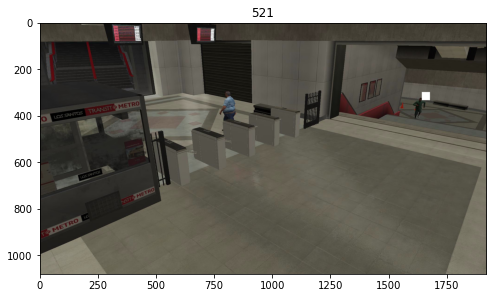

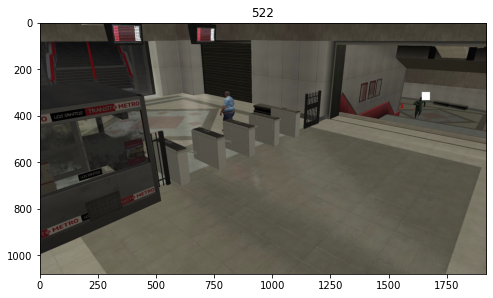

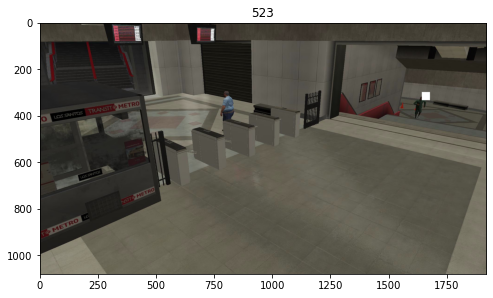

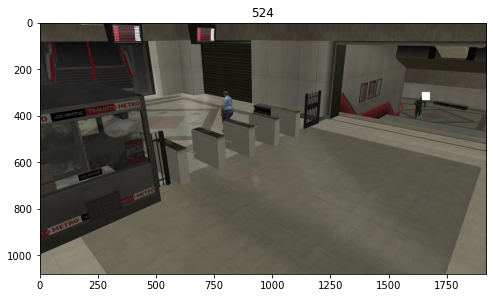

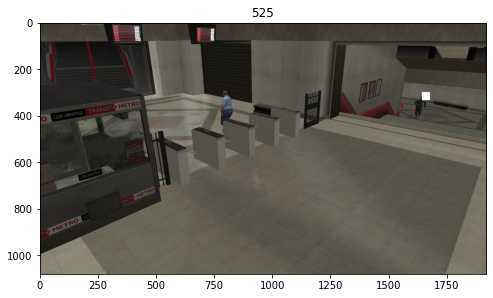

...

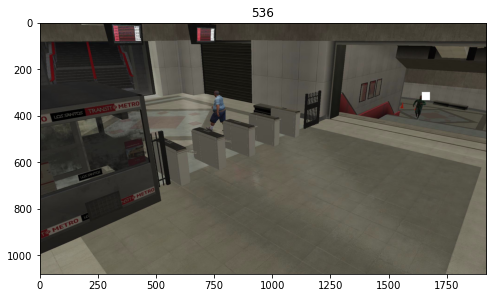

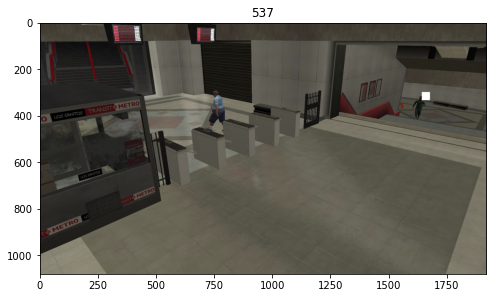

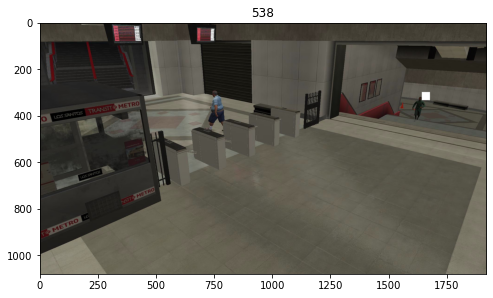

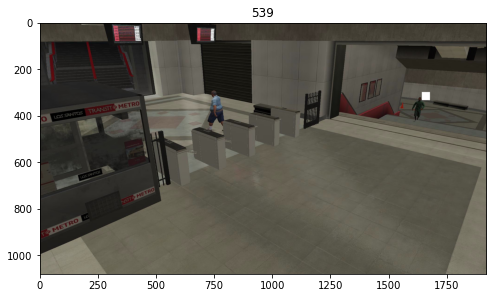

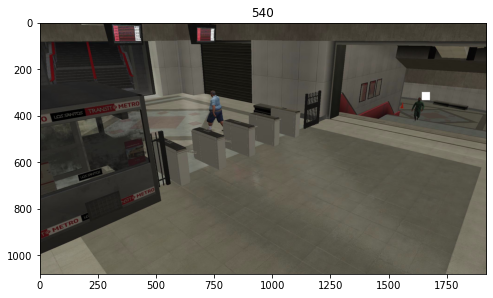

In [39]:
i=[300, 1640, 35, 35]
for index in range(521, 541):
    frame = str(index)
    img = cv2.imread(r"/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/" + frame + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
    index=str(index)
    plt.figure(figsize=(8, 6),)
    plt.title(index)
    plt.imshow(img)

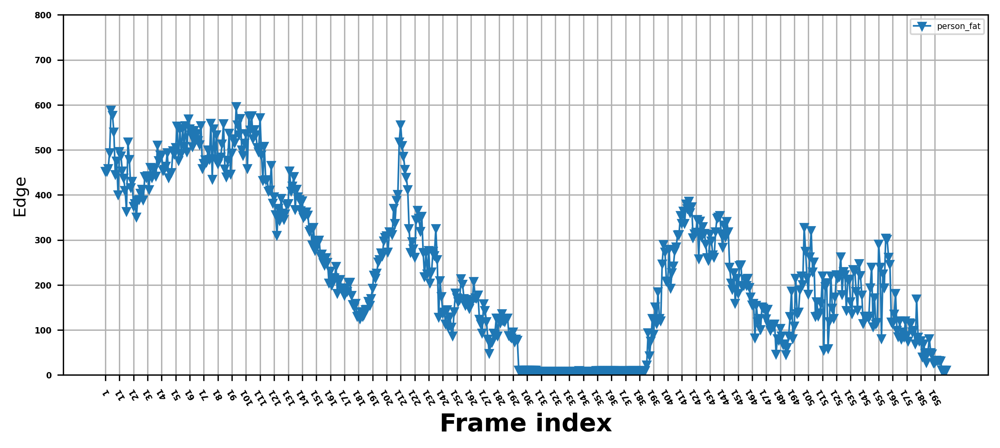

In [83]:
import torch as t
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(10, 4),dpi=300)
a=1
b=600
x_=np.arange(a,b,1)
y_accuracy=[]
err_list_subway=t.load("/home/zhiqiang/project/frame_edge_dict_subway2.pkl")
for i in range(a,b):
    y_accuracy.append(err_list_subway[i])

x = list(np.arange(a,b,10))
#plt.grid(linestyle="-",color="r")
#plt.grid(True)
lw=1.0
plt.plot(x_, y_accuracy,label="person_fat",linestyle='-',linewidth=lw,marker='v',markersize='3',markeredgewidth=2)
plt.grid(True)
plt.xticks(x, x)
plt.ylim((0, 800))
plt.xticks(fontsize=5,weight="bold",rotation=120)
plt.yticks(fontsize=5,weight="bold")
plt.ylabel("Edge",fontsize=10)  #X轴标签
plt.xlabel("Frame index",fontsize=15,weight="bold") #Y轴标签
#plt.xlabel('Minimun-object-area-ratio*1000',fontsize=20)
#plt.ylabel('Y')#通过 xlim 和 ylim 来设限定轴的范围，通过 xlabel 和 ylabel 来设置轴的名称
plt.legend(loc='best',fontsize=5)

/home/zhiqiang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


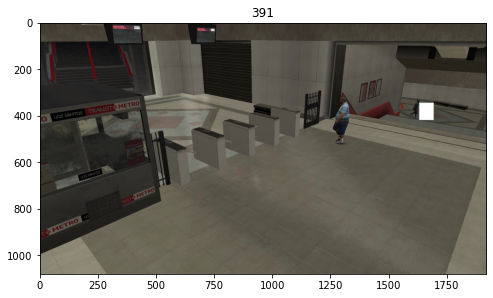

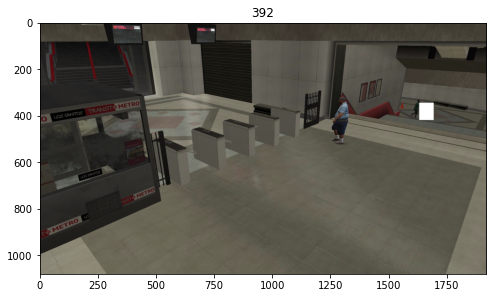

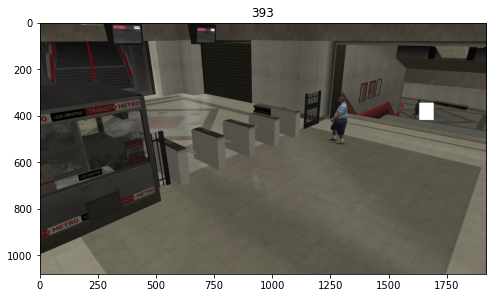

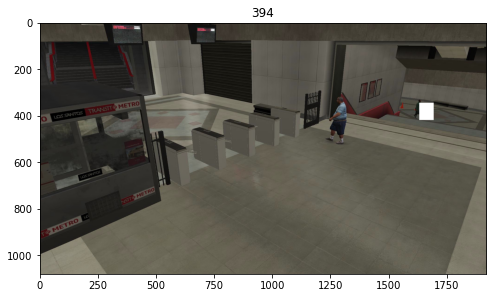

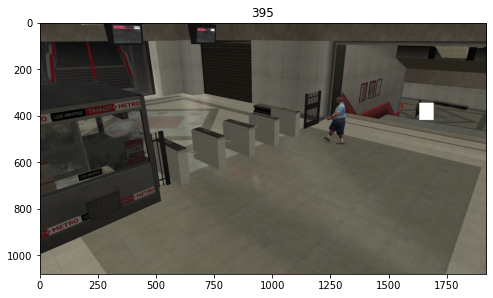

...

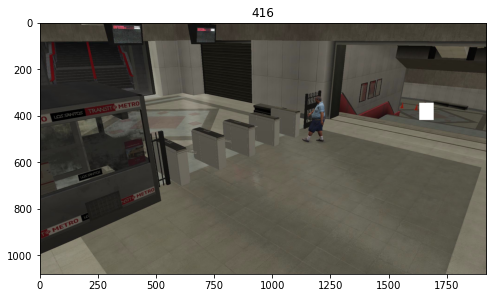

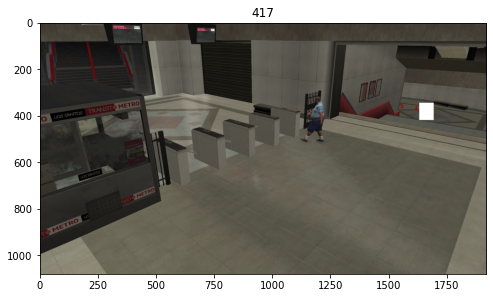

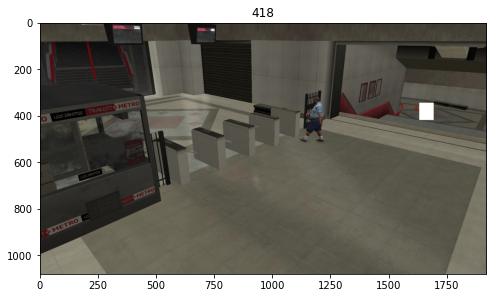

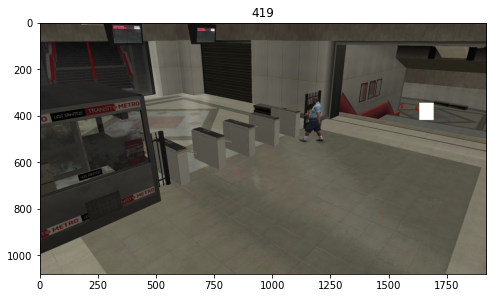

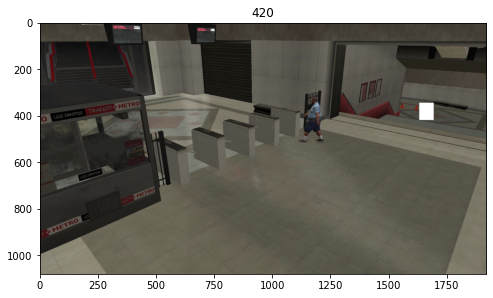

In [44]:
i=[346, 1629, 74, 62]
for index in range(391, 421):
    frame = str(index)
    img = cv2.imread(r"/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/" + frame + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
    index=str(index)
    plt.figure(figsize=(8, 6),)
    plt.title(index)
    plt.imshow(img)

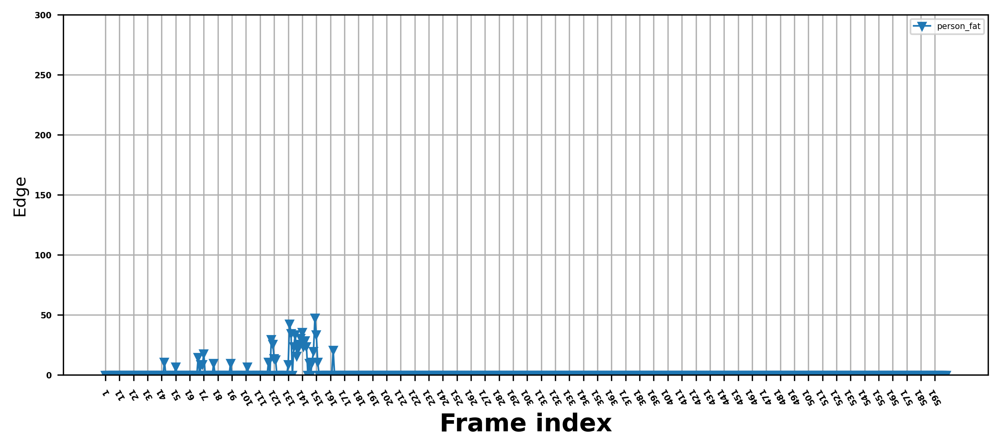

In [129]:
import torch as t
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(10, 4),dpi=300)
a=1
b=600
x_=np.arange(a,b,1)
y_accuracy=[]
err_list_subway=t.load("/home/zhiqiang/project/frame_edge_dict_subway3.pkl")
for i in range(a,b):
    y_accuracy.append(err_list_subway[i])

x = list(np.arange(a,b,10))
#plt.grid(linestyle="-",color="r")
#plt.grid(True)
lw=1.0
plt.plot(x_, y_accuracy,label="person_fat",linestyle='-',linewidth=lw,marker='v',markersize='3',markeredgewidth=2)
plt.grid(True)
plt.xticks(x, x)
plt.ylim((0, 300))
plt.xticks(fontsize=5,weight="bold",rotation=120)
plt.yticks(fontsize=5,weight="bold")
plt.ylabel("Edge",fontsize=10)  #X轴标签
plt.xlabel("Frame index",fontsize=15,weight="bold") #Y轴标签
#plt.xlabel('Minimun-object-area-ratio*1000',fontsize=20)
#plt.ylabel('Y')#通过 xlim 和 ylim 来设限定轴的范围，通过 xlabel 和 ylabel 来设置轴的名称
plt.legend(loc='best',fontsize=5)

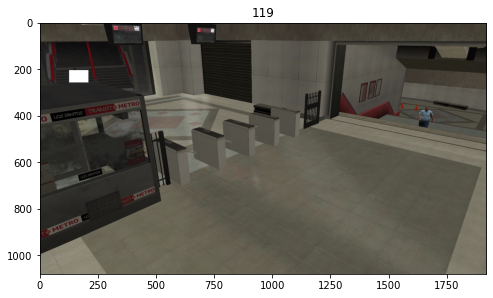

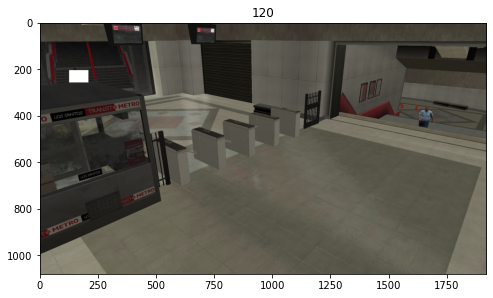

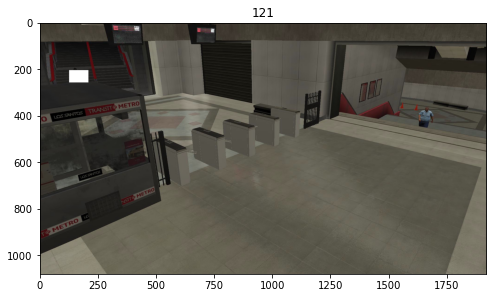

In [73]:
i=[206, 125, 53, 83]
for index in range(119, 122):
    frame = str(index)
    img = cv2.imread(r"/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/" + frame + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
    index=str(index)
    plt.figure(figsize=(8, 6))
    plt.title(index)
    plt.imshow(img)

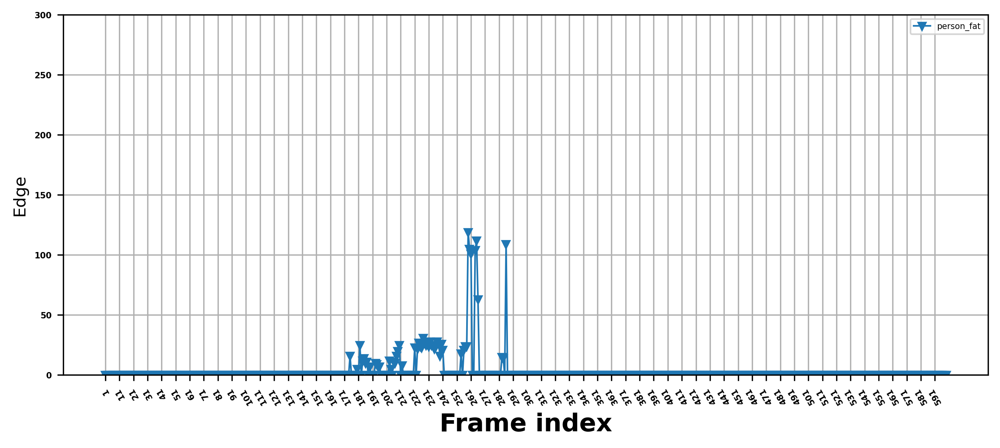

In [121]:
import torch as t
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(10, 4),dpi=300)
a=1
b=600
x_=np.arange(a,b,1)
y_accuracy=[]
err_list_subway=t.load("/home/zhiqiang/project/frame_edge_dict_subway4.pkl")
for i in range(a,b):
    y_accuracy.append(err_list_subway[i])

x = list(np.arange(a,b,10))
#plt.grid(linestyle="-",color="r")
#plt.grid(True)
lw=1.0
plt.plot(x_, y_accuracy,label="person_fat",linestyle='-',linewidth=lw,marker='v',markersize='3',markeredgewidth=2)
plt.grid(True)
plt.xticks(x, x)
plt.ylim((0, 300))
plt.xticks(fontsize=5,weight="bold",rotation=120)
plt.yticks(fontsize=5,weight="bold")
plt.ylabel("Edge",fontsize=10)  #X轴标签
plt.xlabel("Frame index",fontsize=15,weight="bold") #Y轴标签
#plt.xlabel('Minimun-object-area-ratio*1000',fontsize=20)
#plt.ylabel('Y')#通过 xlim 和 ylim 来设限定轴的范围，通过 xlabel 和 ylabel 来设置轴的名称
plt.legend(loc='best',fontsize=5)

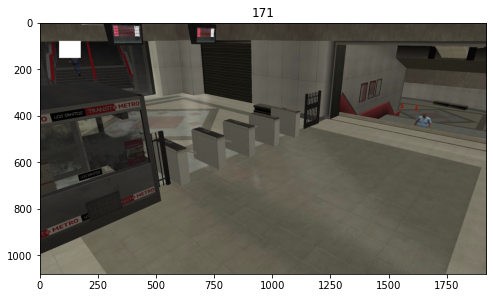

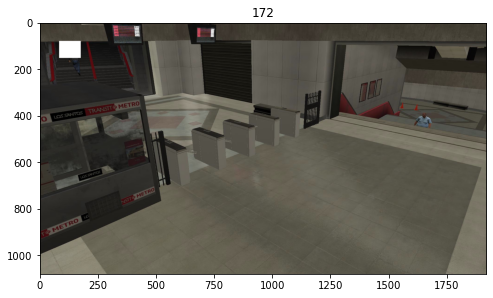

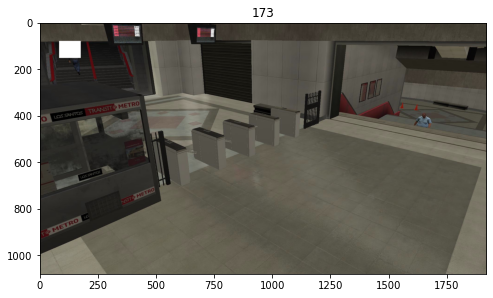

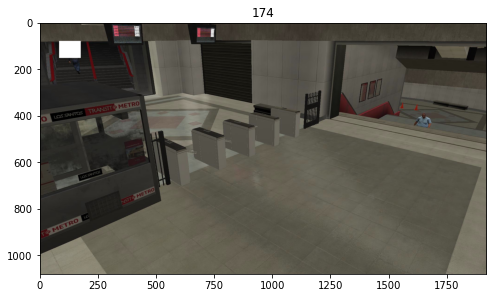

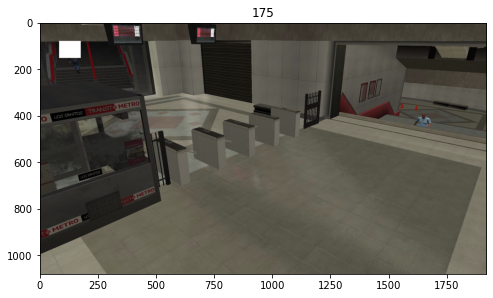

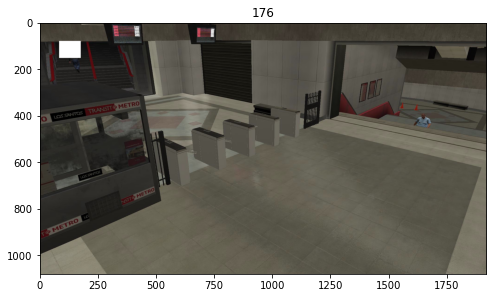

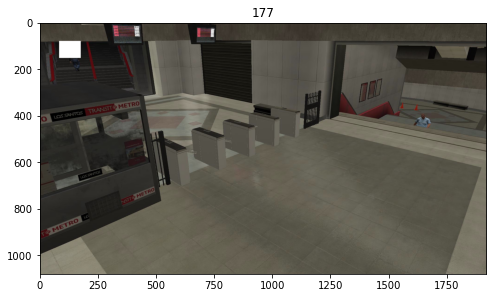

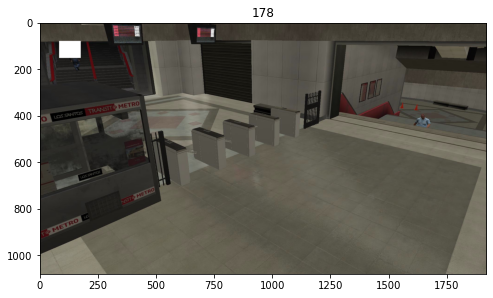

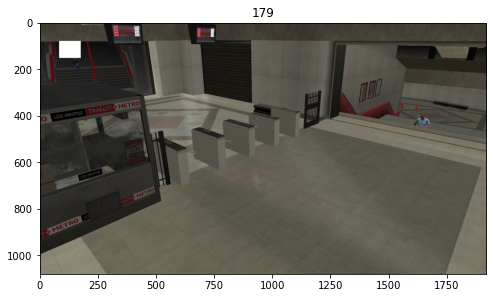

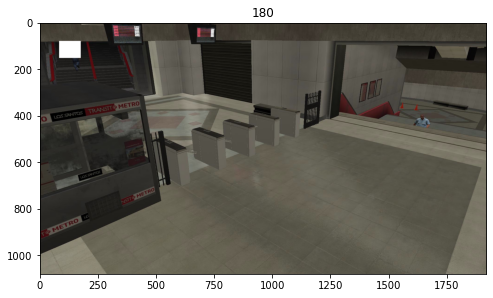

In [98]:
i=[81, 82, 73, 93]
for index in range(171,181):
    frame = str(index)
    img = cv2.imread(r"/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/" + frame + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
    index=str(index)
    plt.figure(figsize=(8, 6),)
    plt.title(index)
    plt.imshow(img)

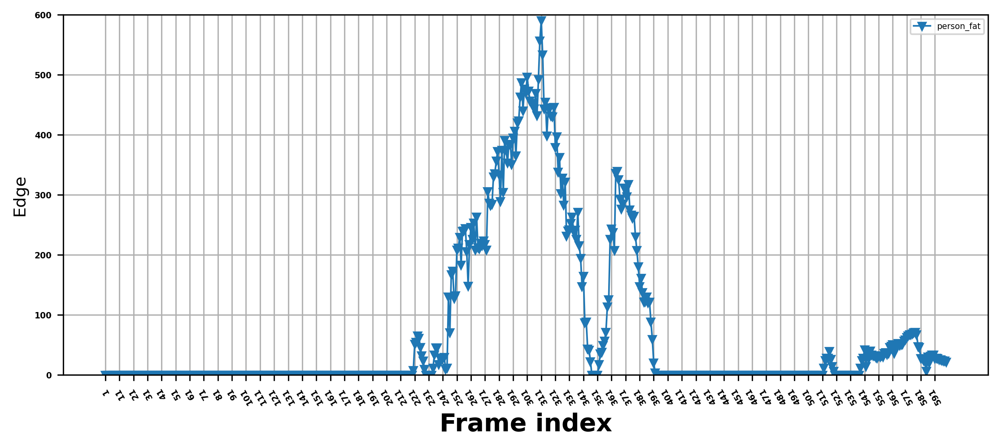

In [125]:
import torch as t
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(10, 4),dpi=300)
a=1
b=600
x_=np.arange(a,b,1)
y_accuracy=[]
err_list_subway=t.load("/home/zhiqiang/project/frame_edge_dict_subway5.pkl")
for i in range(a,b):
    y_accuracy.append(err_list_subway[i])
x = list(np.arange(a,b,10))
#plt.grid(linestyle="-",color="r")
#plt.grid(True)
lw=1.0
plt.plot(x_, y_accuracy,label="person_fat",linestyle='-',linewidth=lw,marker='v',markersize='3',markeredgewidth=2)
plt.grid(True)
plt.xticks(x, x)
plt.ylim((0, 600))
plt.xticks(fontsize=5,weight="bold",rotation=120)
plt.yticks(fontsize=5,weight="bold")
plt.ylabel("Edge",fontsize=10)  #X轴标签
plt.xlabel("Frame index",fontsize=15,weight="bold") #Y轴标签
#plt.xlabel('Minimun-object-area-ratio*1000',fontsize=20)
#plt.ylabel('Y')#通过 xlim 和 ylim 来设限定轴的范围，通过 xlabel 和 ylabel 来设置轴的名称
plt.legend(loc='best',fontsize=5)

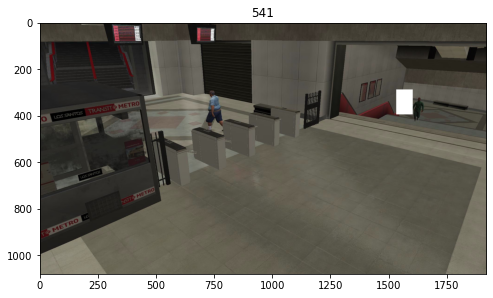

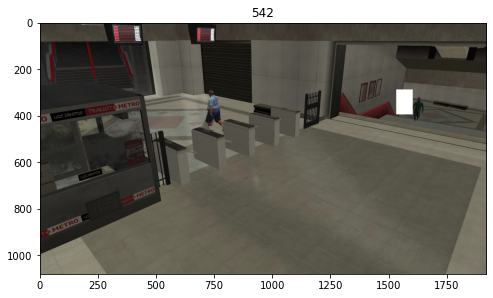

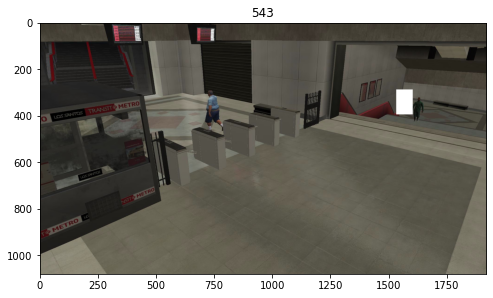

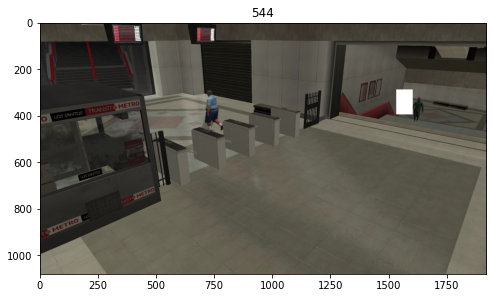

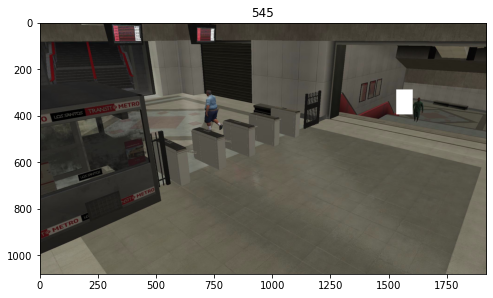

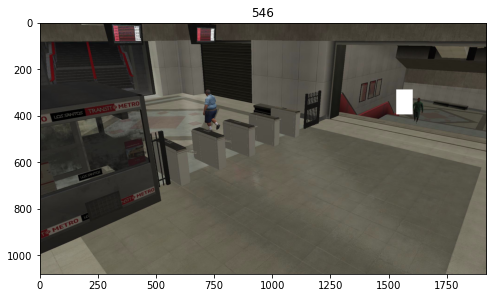

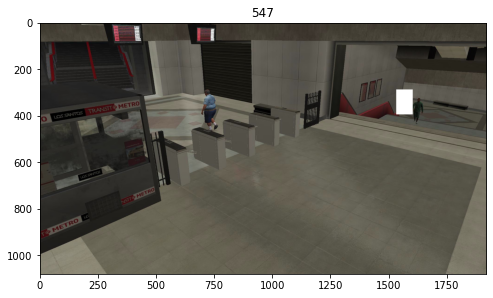

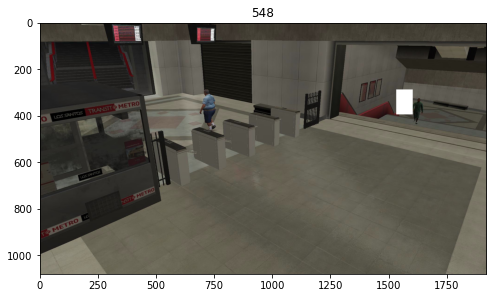

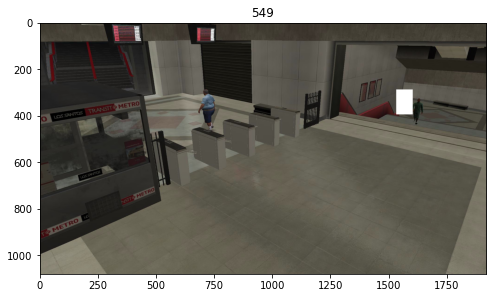

In [127]:
i=[289, 1530, 107, 71]
for index in range(541, 550):
    frame = str(index)
    img = cv2.imread(r"/home/zhiqiang/PycharmProjects/efficientdet-pytorch-2.0/img/subway_frame/" + frame + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img[i[0]:(i[0]+i[2]),i[1]:(i[1]+i[3])]=255
    index=str(index)
    plt.figure(figsize=(8, 6),)
    plt.title(index)
    plt.imshow(img)